# Wealth vs Quality of Life - Do richer places lead better lives?
> *Sam Leahy, Juliana Lima, Bethania Sequera, Alex Tsai, Yi Zhang*

## Contents:
### Setup:
1. [Modules and Dependencies](#M&D)
2. [API Requirements](#API)
### Question 1: Do richer places have better health outcomes?
1. [Metric Definitions](#MD1)
2. [Data Cleaning](#DC1)
3. Exploratory Data Analysis - Each subsection has a graphic and a brief analysis of the data reviewed
    - [Wealth Check](#EDA1-1)
    - [A Geographical View of Wealth](#EDA1-2)
    - [](#EDA1-3)

### Question 2: Do richer places have better housing conditions?

### Question 3: Do richer places have better energy utilities?

### Question 4: Do richer places have better public order?


<a id='M&D'></a>
# Setup
## Modules and Dependencies
Generally, all of the modules used here either come built-in with Python or the environment installed with the Conda command:
```python
conda create -n dev python=3.10 anaconda -y
```
If necessary, please follow the instructions on the associated [Github README file](https://github.com/AlexPei-YuTsai/BerkeleyDataBootcampProjectONE#installationprerequisites) and acquire all the packages necessary with the package installer of your choice as per each module's respective installation instructions.

In [1]:
# Using these for processing CSV files and doing math
import pandas as pd
from scipy.stats import linregress
import numpy as np
import matplotlib.pyplot as plt
import math

# Using these to plot out geographical data
import hvplot.pandas
from holoviews.operation.datashader import rasterize

# Using these for any APIs we call
import requests
import json

<a id= "API"></a>
## API Requirements
Some of the data used for our research was extracted online through HTTP requests and API calls. As API keys are not uploaded onto our GitHub repository for security reasons, please follow our [GitHub README documentation regarding that topic](https://github.com/AlexPei-YuTsai/BerkeleyDataBootcampProjectONE#api-keys) and install any API keys needed for your own data extraction and replication purposes. 

In [8]:
# Question 1: Do richer places have better health outcomes?

# NO API KEYS REQUIRED - Any data used is extracted from the "PLACES" CSV file downloaded from the CDC's website
# NOTE: Optionally, you can import the module below if you'd rather use the CDC's API to access data
# NOTE: However, you can't get an API Token without working for them, so I do not recommend doing things this way given their throttling limits

# Question 2: Do richer places have better housing conditions?

# Question 3: Do richer places have better energy utilities?

# Question 4: Do richer places have better public order?

<a id='MD1'></a>
# Question 1: Do richer places have better health outcomes?
Logical reasoning dictates that if you need money to afford healthcare, then the richer households should have better healthcare and consequently lead healthier lives. However, is that true and to what extent is that assumption true? 

To answer this question, data from the IRS is used as a means of measuring "wealth" while data from the CDC is used as a means of measuring "health". The scope of our "places" is defined such that we are comparing wealth and health data on a **ZIP Code-level**.

## Metric Definitions
After some data cleaning and preparation, all of the charts and graphical representations of the data is generated with the `AGI+medical_data.csv` file exported into the `Resources` folder of this repository. These are the definitions of the columns in that exported dataframe:

### For Identification (This is also the basic point of data in which our metrics will be compared upon):
- **ZIPCODE:** The official 5-digit postal code of a particular area as defined by the data given by 2020 United States Postal Service. 
    - e.g.: 33480 is the ZIP Code for Palm Beach
- STATE: The 2-letter state abbreviation for the state a ZIP Code belongs to. 
    - e.g.: "NY" is New York, "CA" is California.
- lng: The longitude of a given ZIP Code in positive and negative degrees. Everything positive is *east* of the Prime Meridian, everything negative is *west* of it.
- lat: The latitude of a given ZIP Code. Everything positive is *north* of the equator, everything negative is *south* of it.

### For Wealth:

All of the data here is derived from the IRS's [2020 SOI Tax Data](https://www.irs.gov/statistics/soi-tax-stats-individual-income-tax-statistics-2020-zip-code-data-soi). The exact documentation can be downloaded from that website for your personal perusal.

- Total Individuals: The `N2` column of the raw downloadable tax data. Represents the number of individuals in that ZIP Code.  
- Total Income Amount: The `A02650` column. Represents the total income amount reported for a given ZIP Code in *thousands of dollars*.
- **Total Income per Individual(This is our definition of the "Wealth" of a ZIP Code):** Divide the Total Income Amount by the Total Individuals to get the Total Income per Individual of a ZIP Code. Since different ZIP Codes have different populations, we chose to normalize the wealth of each region by examining the average total income of each individual residing in that tabulated region.
    - *Disclaimer: The data might not be fully representative of the US's populations as many people are exempt from filing tax returns. However, as this is official IRS data, we find their data to be a suitable estimate even if the actual numbers are off.*
    
### For Health:

Every other data column is collected from the [CDC's PLACES data](https://chronicdata.cdc.gov/500-Cities-Places/PLACES-ZCTA-Data-GIS-Friendly-Format-2022-release/kee5-23sr) and is a measure of some kind of health phenomenon. The exact data dictionary can be found in the previous link and their definition for what "prevalence" is and how it's calculated can be found in their [PLACES measure definitions](https://www.cdc.gov/places/measure-definitions/) page.

To summarize, the CDC's dataset has 4 kinds of health metrics: Health Outcomes (Arthritis, Cancer, etc.), Prevention (Various screenings and health insurance coverage), Health Risk Behaviors (Binge drinking, smoking, things that usually lead to poor health), and Health Status (Different ways people rate their own health).

Each metric is a "crude prevalence" reflecting a weighted, modified (depending on the methodology), estimated fraction of the resident adults of each ZIP Code with that given phenomenon where the denominator is the total considered population and the numerator is usually those who have been diagnosed with that condition by a licensed medical professional. Each of the data definitions below is merely a simple description, so do visit the sources given for a more comprehensive understanding of the scope and limits of each metric.

**Every column here is Health data compared with our Wealth metric (Names in `these marks` are the original names from the raw CDC PLACES CSV data):**

*Health Outcomes*

- Arthritis: `ARTHRITIS_CrudePrev` column. Prevalence of arthritis among adults over 18 years old.
- Current Asthma: `CASTHMA_CrudePrev` column. Prevalence of currently asthmatic adults over 18 years old.
- High Blood Pressure: `BPHIGH_CrudePrev` column. Prevalence of high blood pressure among adults over 18 years old.
- (Non-Skin) Cancer: `CANCER_CrudePrev` column. Prevalence of cancer (excluding skin cancer) among adults over 18 years old.
- High Cholesterol: `HIGHCHOL_CrudePrev` column. Prevalence of high cholesterol among adults over 18 years old.
- Chronic Kidney Disease: `KIDNEY_CrudePrev` column. Prevalence of chronic kidney disease among adults over 18 years old.
- Chronic Obstructive Pulmonary Disease: `COPD_CrudePrev` column. Prevalence of chronic obstructive pulmonary disease among adults over 18 years old.
- Coronary Heart Disease: `CHD_CrudePrev` column. Prevalence of coronary heart disease among adults over 18 years old.
- Depression: `DEPRESSION_CrudePrev` column. Prevalence of depression among adults over 18 years old.
- Diabetes: `DIABETES_CrudePrev` column. Prevalence of diagnosed diabetes among adults over 18 years old (excluding diabetes during pregnancy).
- Obesity: `OBESITY_CrudePrev` column. Prevalence of obesity among adults over 18 years old based on BMI results (excluding certain people and pregnant women).
- All Teeth Lost (Older Adults): `TEETHLOST_CrudePrev` column. Prevalence of losing all natural teeth due to tooth decay or gum disease among adults over 65 years old.
- Stroke: `STROKE_CrudePrev` column. Prevalence of strokes among adults over 18 years old.
- Cervical Cancer (Adult Women): `CERVICAL_CrudePrev` column. Prevalence of cervical cancer amongst adult women between 21 to 65 years old.

*Prevention*

- Lacking Health Insurance: `ACCESS2_CrudePrev` column. Prevalence of respondents who report having no current health insurance coverage amongst adults between 18 to 64 years old.
- Routine Health Checkups: `CHECKUP_CrudePrev` column. Prevalence of respondents who report having been to a doctor for a routine checkup (e.g., a general physical exam, not an exam for a specific injury, illness, condition) in the previous year amongst adults over 18 years old.
- Dentist Visits: `DENTAL_CrudePrev` column. Prevalence of respondents who report having been to the dentist or dental clinic in the previous year amongst adults over 18 years old.
- Taking Medicine for High Blood Pressure: `BPMED_CrudePrev` column. Prevalence of respondents who report taking medicine for high blood pressure amongst adults over 18 years old who have been diagnosed with high blood pressure.
- Cholesterol Screening: `CHOLSCREEN_CrudePrev` column. Prevalence of respondents who report having their cholesterol checked within the previous 5 years amongst adults over 18 years old.
- Mammography (Older Women): `MAMMOUSE_CrudePrev` column. Prevalence of respondents who report having had a mammogram within the previous 2 years amongst adult women between 50 to 74 years old.
- FOBT/Colon Screening (Older Adults): `COLON_SCREEN_CrudePrev` column. Prevalence of respondents who report having had 1) a fecal occult blood test (FOBT) within the past year, 2) a sigmoidoscopy within the past 5 years and a FOBT within the past 3 years, or 3) a colonoscopy within the past 10 years amongst adults between 50 to 75 years old.
- Core Clinical Prevention (Older Women): `COREW_CrudePrev` column. Prevalence of respondents reporting having received all of the following: an influenza vaccination in the past year; a pneumococcal vaccination (PPV) ever; either a fecal occult blood test (FOBT) within the past year, a sigmoidoscopy within the past 5 years and a FOBT within the past 3 years, or a colonoscopy within the previous 10 years; and a mammogram in the past 2 years amongst adult women over 65 years old.
- Core Clinical Prevention (Older Men): `COREM_CrudePrev` column. Prevalence of respondents reporting having received all of the following: an influenza vaccination in the past year; a PPV ever; and either a fecal occult blood test (FOBT) within the past year, a sigmoidoscopy within the past 5 years and a FOBT within the past 3 years, or a colonoscopy within the past 10 years amongst adult men over 65 years old.

*Health Risk Behaviors*

- Binge Drinking: `BINGE_CrudePrev` column. Prevalence of adults over 18 years old who report having five or more drinks (men) or four or more drinks (women) on an occasion in the past 30 days.
- Currently Smoking: `CSMOKING_CrudePrev` column. Prevalence of respondents who report having smoked ≥100 cigarettes in their lifetime and currently smoke every day or some days amongst adults over 18 years old.
- No Leisure-Time Physical Activity: `LPA_CrudePrev` column. Prevalence of respondents who answered “no” to the following question: “During the past month, other than your regular job, did you participate in any physical activities or exercises such as running, calisthenics, golf, gardening, or walking for exercise?” amongst adults over 18 years old.
- Less than 7 Hours of Sleep: `SLEEP_CrudePrev` column. Prevalence of respondents who report usually getting insufficient sleep (<7 hours for those aged ≥18 years, on average, during a 24-hour period) amongst adults over 18 years old.

*Health Status*

- 'Poor' Self-Rated Mental Health Status: `MHLTH_CrudePrev` column. Prevalence of respondents who report 14 or more days during the past 30 days during which their mental health was not good amongst adults over 18 years old.
- 'Poor' Self-Rated Physical Health Status: `PHLTH_CrudePrev` column. Prevalence of respondents who report 14 or more days during the past 30 days during which their physical health was not good among adults over 18 years old.
- 'Fair' or 'Poor' Self-Rated Health Status: `GHLTH_CrudePrev` column. Prevalence of respondents who report their general health status as “fair” or “poor.”

Any potential limitations in their dataset can be found on their website in the PLACES measure definitions page given above.

<a id='DC1'></a>
## Data Cleaning

The file below named `AGI+coords_data.csv` is processed from a larger file that is not included in this GitHub repository due to its sheer size. However, for those who are interested, the file used merges select columns of the [Statistics of Income  - Tax Data from the IRS](https://www.irs.gov/statistics/soi-tax-stats-individual-income-tax-statistics-2020-zip-code-data-soi) file with the [ZIP Codes to Map Coordinates conversion file](https://simplemaps.com/data/us-zips).

As per the Metric Definitions above, we only selected the columns the `STATE`, `ZIPCODE`, `N2`, and `A02650` columns, which later got merged with the `Resources/uszips.csv` file's `zip`, `lat`, and `lng` columns. The data was merged on the ZIP Code columns both CSV files have. Furthermore, the data may have been sorted by Total Income per Individual beforehand.

In [13]:
# Get Independent Variable Data
test_df = pd.read_csv("Resources/AGI+coords_data.csv")

# As per the Metric Definitions, all money columns here are in thousands of dollars

# Also dropped 3 rows because some ZIPs didn't have coordinates, apparently. Columns renamed for personal convenience
test_df = test_df.drop(["Unnamed: 0", "index"], axis=1).dropna(axis="index", how="any").rename(columns={"N2":"Total Individuals", "A02650":"Total Income Amount"})
test_df

,STATE,ZIPCODE,Total Individuals,Total Income Amount,Total Income per Individual,lng,lat
0,MS,38738,140.0,5.770000e+02,4.121429,-90.53653,33.93049
1,MO,64147,280.0,1.591000e+03,5.682143,-94.54688,38.85387
2,SD,57794,390.0,3.206000e+03,8.220513,-102.40695,43.12071
3,TN,37140,390.0,3.239000e+03,8.305128,-87.65245,35.86345
4,MT,59444,270.0,2.321000e+03,8.596297,-111.34881,48.65227
...,...,...,...,...,...,...,...
27637,CA,94301,14750.0,1.527798e+07,1035.795390,-122.14992,37.44424
27638,CA,94027,5820.0,6.971688e+06,1197.884536,-122.20313,37.45399
27639,FL,33480,9050.0,1.466156e+07,1620.061768,-80.04075,26.69796
27640,CA,94104,1510.0,2.990505e+06,1980.466887,-122.40211,37.79144


Next, we have to import the dependent variables. All this is extracted from the CDC's PLACES data referred to in the Metric Definitions section and the full CSV can be found in the `Resources` folder if better analysis can be made with the columns I chose not to use.

The goal is to correlate the Total Income per Individual with the various health metrics described to see if ZIP Codes with higher average individual wealth have better health than those with lower average individual wealth.

Though ZCTA5 isn't completely equivalent to ZIPCodes according to online definitions, it's close enough such that it's generally interexchangeable given how they are mostly, if not completely equal in terms of their general coordinate positions. Also, all the `95CI` columns, data describing the upper and lower bound of their estimates given their 95% confidence interval, are dropped as we only need to find correlations with one type of metric (bigger numbers or smaller numbers for all would not change the strength of a correlation). Lastly, the `TotalPopulation` and `Geolocation` columns are dropped as they are not necessary with the corresponding data columns we have in our `AGI+coords_data.csv` file.

In [14]:
# Get Dependent Variable Data
med_df = pd.read_csv("Resources/PLACES__ZCTA_Data__GIS_Friendly_Format___2022_release.csv")
med_df

# TotalPopulation and Geolocation columns match up pretty well with the tax information dataset, so these columns are also safe to ignore

,ZCTA5,TotalPopulation,ACCESS2_CrudePrev,ACCESS2_Crude95CI,ARTHRITIS_CrudePrev,ARTHRITIS_Crude95CI,BINGE_CrudePrev,BINGE_Crude95CI,BPHIGH_CrudePrev,BPHIGH_Crude95CI,...,OBESITY_Crude95CI,PHLTH_CrudePrev,PHLTH_Crude95CI,SLEEP_CrudePrev,SLEEP_Crude95CI,STROKE_CrudePrev,STROKE_Crude95CI,TEETHLOST_CrudePrev,TEETHLOST_Crude95CI,Geolocation
0,8065,7398,11.8,"(10.6, 13.0)",23.6,"(22.8, 24.3)",17.0,"(16.8, 17.2)",NaN,NaN,...,"(31.5, 33.0)",9.2,"( 8.7, 9.7)",36.9,"(36.0, 37.7)",2.8,"( 2.7, 3.0)",12.4,"(10.0, 15.2)",POINT (-75.035071 40.00536195)
1,28443,17512,13.7,"(12.4, 15.1)",25.2,"(24.5, 25.9)",16.3,"(16.1, 16.5)",33.1,"(32.3, 33.8)",...,"(27.3, 28.8)",9.2,"( 8.7, 9.7)",32.0,"(31.2, 32.8)",2.8,"( 2.7, 3.0)",10.3,"( 8.6, 12.6)",POINT (-77.67400103 34.40735763)
2,3103,36476,16.1,"(15.2, 17.1)",23.4,"(22.9, 23.8)",18.0,"(17.8, 18.2)",29.4,"(29.0, 29.8)",...,"(32.4, 33.4)",11.3,"(10.8, 11.7)",36.2,"(35.7, 36.7)",2.8,"( 2.6, 2.9)",17.0,"(14.5, 19.7)",POINT (-71.44426868 42.95332718)
3,4042,4281,12.0,"( 9.6, 14.7)",25.6,"(24.2, 26.9)",16.6,"(16.0, 17.2)",29.7,"(28.3, 31.1)",...,"(29.3, 32.5)",8.5,"( 7.5, 9.5)",33.1,"(31.4, 34.7)",2.4,"( 2.2, 2.7)",13.0,"( 8.4, 18.3)",POINT (-70.62451707 43.62953242)
4,1109,30250,14.1,"(13.2, 15.1)",24.6,"(24.3, 24.9)",14.8,"(14.5, 14.9)",33.9,"(33.6, 34.2)",...,"(37.7, 38.6)",12.4,"(12.0, 12.8)",42.2,"(41.6, 42.7)",4.0,"( 3.8, 4.1)",25.6,"(23.3, 28.0)",POINT (-72.54882748 42.11839795)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32404,90249,26669,15.7,"(14.7, 16.8)",17.9,"(17.5, 18.3)",15.6,"(15.5, 15.7)",29.8,"(29.4, 30.2)",...,"(29.4, 30.4)",9.8,"( 9.4, 10.2)",35.6,"(35.0, 36.1)",3.0,"( 2.9, 3.2)",11.2,"( 9.2, 13.8)",POINT (-118.3170528 33.90148653)
32405,92551,30815,21.0,"(19.7, 22.3)",17.1,"(16.9, 17.4)",19.0,"(18.8, 19.2)",27.4,"(27.1, 27.7)",...,"(36.6, 37.4)",11.0,"(10.6, 11.4)",37.6,"(37.1, 38.0)",2.5,"( 2.4, 2.6)",14.6,"(13.4, 15.9)",POINT (-117.2261219 33.88144718)
32406,98226,41235,10.3,"( 9.7, 11.0)",24.8,"(24.3, 25.3)",19.0,"(18.8, 19.2)",29.8,"(29.3, 30.2)",...,"(27.4, 28.2)",10.4,"(10.1, 10.7)",28.4,"(28.0, 28.8)",3.0,"( 2.8, 3.1)",11.5,"( 9.8, 13.4)",POINT (-122.4247832 48.80190392)
32407,87553,1209,19.8,"(16.5, 23.5)",25.2,"(24.2, 26.3)",11.9,"(11.5, 12.1)",35.0,"(33.8, 36.2)",...,"(27.8, 29.6)",13.9,"(13.2, 14.7)",32.4,"(31.6, 33.3)",3.9,"( 3.5, 4.3)",15.3,"(12.6, 18.5)",POINT (-105.706967 36.20595411)


In [15]:
# We'll ignore any of the CI columns and keep the ZCTA5 column, so there should be 31 columns left

# Extract all Prevalence columns
prev_df = med_df.filter(like="Prev")

# Can't forget to get the ZIP Code data or else there would be nothing to merge on
prev_df.insert(0, "ZIPCODE", med_df.loc[:, "ZCTA5"])

# Drop nulls
a_df = prev_df.dropna(axis="index", how="any")

# Join data on ZIP Codes, drop nulls again just in case, and rename them for presentation purposes
medical_df = test_df.merge(a_df, how="left", on="ZIPCODE").dropna(axis="index", how="any")\
.rename(columns=
        {# Health Outcomes
         "ARTHRITIS_CrudePrev":"Arthritis", "BPHIGH_CrudePrev":"High Blood Pressure", "CANCER_CrudePrev":"(Non-Skin) Cancer", 
         "CASTHMA_CrudePrev":"Current Asthma", "CERVICAL_CrudePrev":"Cervical Cancer (Adult Women)", "CHD_CrudePrev":"Coronary Heart Disease",
         "COPD_CrudePrev":"Chronic Obstructive Pulmonary Disease", "DEPRESSION_CrudePrev":"Depression", "DIABETES_CrudePrev":"Diabetes",
         "HIGHCHOL_CrudePrev":"High Cholesterol", "KIDNEY_CrudePrev":"Chronic Kidney Disease", "OBESITY_CrudePrev":"Obesity", "STROKE_CrudePrev":"Stroke", "TEETHLOST_CrudePrev":"All Teeth Lost (Older Adults)",
         # Prevention 
         "ACCESS2_CrudePrev":"Lacking Health Insurance", "BPMED_CrudePrev":"Taking Medicine for High Blood Pressure",
         "CHECKUP_CrudePrev":"Routine Health Checkups", "CHOLSCREEN_CrudePrev":"Cholesterol Screening", 
         "COLON_SCREEN_CrudePrev":"FOBT/Colon Screening (Older Adults)",  "COREM_CrudePrev":"Core Clinical Prevention (Older Men)", "COREW_CrudePrev":"Core Clinical Prevention (Older Women)",
         "DENTAL_CrudePrev":"Dentist Visits", "MAMMOUSE_CrudePrev":"Mammography (Older Women)",
         # Health Risk Behaviors
         "BINGE_CrudePrev":"Binge Drinking", "CSMOKING_CrudePrev":"Currently Smoking", "LPA_CrudePrev":"No Leisure-Time Physical Activity",
         "SLEEP_CrudePrev":"Less than 7 Hours of Sleep", 
         # Health Status
         "GHLTH_CrudePrev":"'Fair' or 'Poor' Self-Rated Health Status", "MHLTH_CrudePrev":"'Poor' Self-Rated Mental Health Status", 
         "PHLTH_CrudePrev":"'Poor' Self-Rated Physical Health Status"
        })

# Note: Each of the Health Outcomes columns is the "Crude Prevalence" of that particular health phenomenon
# Note: Unless mentioned otherwise, these stats are measured for adults
medical_df

,STATE,ZIPCODE,Total Individuals,Total Income Amount,Total Income per Individual,lng,lat,Lacking Health Insurance,Arthritis,Binge Drinking,...,High Cholesterol,Chronic Kidney Disease,No Leisure-Time Physical Activity,Mammography (Older Women),'Poor' Self-Rated Mental Health Status,Obesity,'Poor' Self-Rated Physical Health Status,Less than 7 Hours of Sleep,Stroke,All Teeth Lost (Older Adults)
0,MS,38738,140.0,5.770000e+02,4.121429,-90.53653,33.93049,32.1,18.5,17.6,...,28.1,2.6,33.0,79.5,15.5,49.2,11.3,41.0,3.5,28.3
1,MO,64147,280.0,1.591000e+03,5.682143,-94.54688,38.85387,19.1,9.0,21.1,...,13.2,1.2,22.9,81.3,21.9,31.9,6.9,37.4,1.0,21.7
2,SD,57794,390.0,3.206000e+03,8.220513,-102.40695,43.12071,20.0,24.0,19.7,...,24.3,4.4,38.5,73.4,20.0,45.5,18.1,35.4,5.9,41.8
3,TN,37140,390.0,3.239000e+03,8.305128,-87.65245,35.86345,27.6,17.0,19.5,...,25.8,2.0,28.5,70.0,16.6,43.0,10.1,43.2,2.5,22.9
4,MT,59444,270.0,2.321000e+03,8.596297,-111.34881,48.65227,15.2,26.5,22.4,...,31.6,3.0,23.5,70.1,15.2,32.9,12.3,32.7,3.3,17.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27634,CA,94301,14750.0,1.527798e+07,1035.795390,-122.14992,37.44424,4.9,19.2,18.2,...,29.0,2.4,12.7,76.6,10.4,20.2,6.5,24.0,2.1,4.7
27635,CA,94027,5820.0,6.971688e+06,1197.884536,-122.20313,37.45399,4.9,22.6,15.6,...,36.9,2.7,12.7,76.1,10.2,20.0,7.2,24.7,2.4,4.9
27636,FL,33480,9050.0,1.466156e+07,1620.061768,-80.04075,26.69796,10.7,32.9,8.6,...,42.1,4.4,20.2,79.3,8.8,19.4,10.2,25.3,4.4,8.3
27637,CA,94104,1510.0,2.990505e+06,1980.466887,-122.40211,37.79144,10.7,20.3,13.5,...,34.1,2.9,22.5,65.4,11.1,18.6,9.4,30.2,3.3,10.3


<a id="EDA1-1"></a>
## Exploratory Data Analysis

The following is some of the univariate and bivariate data explorations we did to get a better understanding of what we are looking at.

### Wealth Check

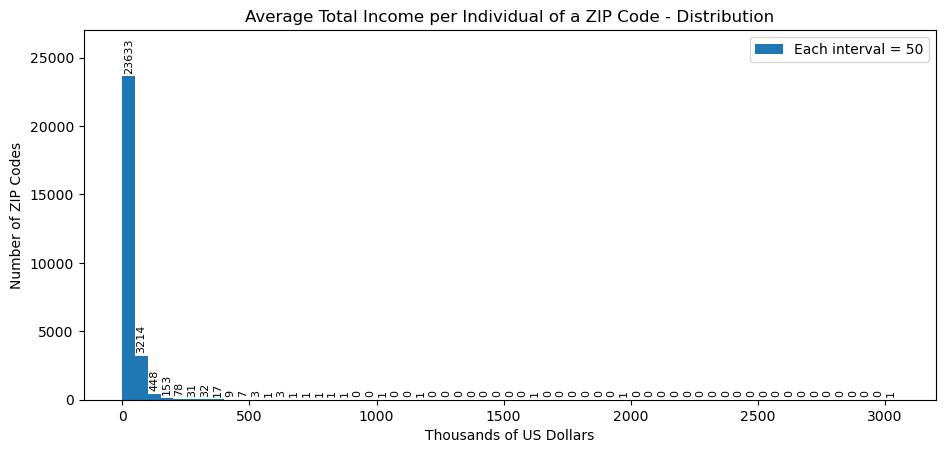

Minimum: 4.121428571428571
Maximum: 3035.926923653846
Mean: 39.052928410344045
Median: 31.46428577380952
1st Quartile: 25.873887987012985
3rd Quartile: 40.45460299965004
IQR: 14.580715012637057
Safe Bounds: 4.002815468057399 - 62.32567551860563


In [24]:
# Setting up a histogram here

# This bit of code is for me to manually set up bin intervals for easier readability
dbins = [i*50.0 for i in range(62)]

plt.figure(figsize=(11,4.8)) 
counts, bins, bars = plt.hist(test_df["Total Income per Individual"], bins=dbins, label="Each interval = 50")
plt.bar_label(bars, fontsize=8, rotation="vertical", padding=2)
plt.ylim(0,27000)
plt.title("Average Total Income per Individual of a ZIP Code - Distribution")
plt.xlabel("Thousands of US Dollars")
plt.ylabel("Number of ZIP Codes")
plt.legend()

plt.show()

# If you're wondering why the chart is so wide, it's because wealth disparity sucks and the Income/Capita in Miami Beach is $3 million
# This calls for a little outlier treatment
q1 = np.quantile(test_df["Total Income per Individual"], .25)
q3 = np.quantile(test_df["Total Income per Individual"], .75)
iqr = q3-q1
ub = 1.5*iqr+q3
lb = q1-1.5*iqr
print(f"Minimum: {test_df['Total Income per Individual'].min()}")
print(f"Maximum: {test_df['Total Income per Individual'].max()}")
print(f"Mean: {test_df['Total Income per Individual'].mean()}")
print(f"Median: {test_df['Total Income per Individual'].median()}")
print(f"1st Quartile: {q1}")
print(f"3rd Quartile: {q3}")
print(f"IQR: {iqr}")
print(f"Safe Bounds: {lb} - {ub}")

# We'll be using the "1.5xIQR rule" heuristic and saving the upper bound for further data treatment later if necessary
# The lower bound is not necessary because none of the data will ever exceed that

You can notice that 85% of all ZIP Codes here in the US has an average Total Income per Individual of less than or equal to $50,000. Considering that the maximum of this dataset is easily over 60 times the value of that bar and 50 times over the upper bound of the 1.5xIQR rule, it's easy to see how the outliers of this dataset easily affected the mean and any other statistic regarding averages.

The median ZIP Code has people earning about $30,000 per tax year, which is rather unfortunate. Perhaps it's poor calculation on our part, but it definitely seemed a lot lower than expected.

<a id="EDA1-2"></a>
### A Geographical View of Wealth
There's this neat little data visualization method called ["choropleth maps"](https://en.wikipedia.org/wiki/Choropleth_map) that is very fascinating and compelling when geographical data is involved. Using some Geographic Information System (GIS) magic and coding finesse, the product can easily tell people what the land is like at a glance by scaling the values of a particular data column with color and mapping them onto the geographical map of the land - a true application of the old adage "A picture is worth a thousand words."

Unfortunately, given our limited time, it didn't feel appropriate to waste too much time learning new modules and painstakingly debugging unfamiliar code, so we opted for an "off-brand" version with something we are more familiar with: HVPlot.

It's not a perfect visualization with demarcated ZIP Code tabulation areas, but the collection of points are still substantial enough to tell a story without us typing a single word.

We simply followed [HVPlot documentation](https://hvplot.holoviz.org/user_guide/Customization.html) to figure out what keyword arguments to include in these blocks of code to create a nation-level and state-level view of the US's wealth distribution.

*Note: Given their interactive functionality, HVPlot maps aren't saved on Jupyter Notebooks, so you'll have to run the notebook yourself to get an idea of what the maps look like. A static screenshot of the nation and state-level views are saved in `Results/EDA_Nation.png` and `Results/EDA_NY.png`, respectively. Please examine the folder and view them for yourself.*

In [29]:
# National View

# Map starts out pretty far because we're also including Hawaii and Alaska
# Non-datashaded map works, but it's super laggy with 27k points, so we'll stick with this for big visualizations

money_plot = test_df.hvplot.points(
    "lng",
    "lat",
    geo = True,
    tiles = "CartoLight",
    frame_width = 800,
    frame_height = 400,
    scale = .7,
    color = "Total Income per Individual",
    cmap = "hot_r",
    colorbar = True,
    datashade=True,
    dynspread=True,
    xlabel="Longitude",
    ylabel="Latitude",
    title= "ZIPCODES by MONEY"
)
print("Black = Big Money, Yellow = Small Money")
money_plot

Black = Big Money, Yellow = Small Money


:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [lng,lat]   (R,G,B,A)

Due to some code issues we've decided not to pursue, the color legend does not appear with this datashaded version of the map. Because of the parameters we've included in the code block above, some patches of colors may also not be completely representative of the reality of the country.

*You can remove the `datashade = True` and `dynspread = True` keyword arguments to have a more accurate view of the US and have a color bar to indicate the relative wealth of a ZIP Code, but we advise against that unless your computer has substantial processing power given how computationally costly it is to graphically render 27,000 points on a map.*

However, even with this simple visualization, it's easy to see where the money is in this country. On the west coast, you can see big blobs of wealthy ZIP Codes around Los Angeles, San Francisco, and Seattle while the Northeast as a whole seems to be comparatively more comfortable than the rest of the country.

In [28]:
# State View
teststate_df = test_df.loc[test_df["STATE"]=="NY"]

money_plot = teststate_df.hvplot.points(
    "lng",
    "lat",
    geo = True,
    tiles = "CartoLight",
    frame_width = 800,
    frame_height = 400,
    scale = .7,
    color = "Total Income per Individual",
    cmap = "hot_r",
    colorbar = True,
    xlabel="Longitude",
    ylabel="Latitude",
    title= "ZIPCODES by MONEY"
)

money_plot

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lng,lat]   (Total Income per Individual)

Almost as if you're pinching a wet piece of tissue paper and pulling it up from the table, the wealth of New York seems to decrease drastically away from one single key point. You can notice how all the ZIP Codes with the highest average Total Income per Individual values are around or in Manhattan and that the colors of the dots rapidly go down to bright yellow as you leave the hustle and bustle of the Big Apple Concrete Jungle.

These cluttered up visualizations by themselves aren't too helpful for strict, rigorous statistical analysis, but they do allow for very quick, visually compelling insights even if the viewers aren't aware of the actual numbers.

<a id="EDA1-3"></a>
### Correlation Table

It's a little out of order, but the bivariate analysis between Total Income per Individual and all the PLACES health metrics will happen first.

In [9]:
# Correlation Table here
# Columns I'm interested in: any columns with a correlation coefficient of >0.6 
corr_table = medical_df.drop(labels=["STATE", "ZIPCODE", "Total Individuals", "AGI", "lng", "lat"], axis="columns").corr(method='pearson')
corr_table

,Total Income per Individual,Lacking Health Insurance,Arthritis,Binge Drinking,High Blood Pressure,Taking Medicine for High Blood Pressure,(Non-Skin) Cancer,Current Asthma,Cervical Cancer (Adult Women),Coronary Heart Disease,...,High Cholesterol,Chronic Kidney Disease,No Leisure-Time Physical Activity,Mammography (Older Women),'Poor' Self-Rated Mental Health Status,Obesity,'Poor' Self-Rated Physical Health Status,Less than 7 Hours of Sleep,Stroke,All Teeth Lost (Older Adults)
Total Income per Individual,1.000000,-0.231399,-0.220412,0.071443,-0.258748,-0.085161,0.065474,-0.285666,0.246820,-0.231022,...,-0.122255,-0.246660,-0.374376,0.156979,-0.329701,-0.418869,-0.350397,-0.308978,-0.279330,-0.377696
Lacking Health Insurance,-0.231399,1.000000,-0.048930,-0.237597,0.271049,-0.088136,-0.375352,0.109077,-0.615151,0.166480,...,0.053484,0.366590,0.610636,-0.172607,0.459749,0.435033,0.501600,0.438011,0.353755,0.549840
Arthritis,-0.220412,-0.048930,1.000000,-0.521219,0.847221,0.786710,0.700740,0.407558,-0.055893,0.906718,...,0.821681,0.780195,0.529935,-0.182320,0.250834,0.538266,0.697995,0.318716,0.781406,0.518181
Binge Drinking,0.071443,-0.237597,-0.521219,1.000000,-0.614711,-0.430130,-0.278097,-0.333973,0.182509,-0.527684,...,-0.467568,-0.591806,-0.474841,0.069180,-0.207076,-0.252502,-0.508226,-0.357930,-0.578229,-0.433314
High Blood Pressure,-0.258748,0.271049,0.847221,-0.614711,1.000000,0.730675,0.466120,0.421693,-0.200766,0.861596,...,0.796257,0.871375,0.746273,-0.105802,0.359024,0.701063,0.794741,0.513127,0.896993,0.679445
Taking Medicine for High Blood Pressure,-0.085161,-0.088136,0.786710,-0.430130,0.730675,1.000000,0.767268,0.047812,0.180114,0.758899,...,0.818898,0.644633,0.374647,-0.013153,-0.099538,0.355554,0.417785,0.109320,0.616697,0.256969
(Non-Skin) Cancer,0.065474,-0.375352,0.700740,-0.278097,0.466120,0.767268,1.000000,-0.130750,0.274479,0.683299,...,0.720877,0.474180,-0.025561,-0.150830,-0.387243,-0.015322,0.156234,-0.313978,0.392485,-0.079351
Current Asthma,-0.285666,0.109077,0.407558,-0.333973,0.421693,0.047812,-0.130750,1.000000,-0.304409,0.341295,...,0.104912,0.460592,0.526803,-0.030530,0.727438,0.496919,0.634457,0.623710,0.530104,0.684221
Cervical Cancer (Adult Women),0.246820,-0.615151,-0.055893,0.182509,-0.200766,0.180114,0.274479,-0.304409,1.000000,-0.269078,...,-0.003398,-0.359770,-0.572467,0.430457,-0.556481,-0.364040,-0.556580,-0.342257,-0.362250,-0.585048
Coronary Heart Disease,-0.231022,0.166480,0.906718,-0.527684,0.861596,0.758899,0.683299,0.341295,-0.269078,1.000000,...,0.819063,0.913470,0.649072,-0.287222,0.257325,0.539886,0.795975,0.280580,0.885917,0.621473


In [22]:
# Ordered by strength of correlation (absolute value used). Note that none of the correlations here are stronger than 0.5
# However, because there could still be the chance that none of the graphs are LINEARLY correlated, it's still important to graph them somewhere and see if there are other relationships that make sense
strength = corr_table.loc[:, "Total Income per Individual"].abs().sort_values(ascending=False)
strength

NameError: name 'corr_table' is not defined

In [11]:
strength.index
# This is an array of sorts, so you can access (for example) "Total Income per Individual" by calling strength.index[0]

Index(['Total Income per Individual', 'Obesity', 'Currently Smoking',
       'All Teeth Lost (Older Adults)', 'No Leisure-Time Physical Activity',
       'Dentist Visits', ''Poor' Self-Rated Physical Health Status',
       ''Fair' or 'Poor' Self-Rated Health Status',
       ''Poor' Self-Rated Mental Health Status', 'Less than 7 Hours of Sleep',
       'Chronic Obstructive Pulmonary Disease', 'Diabetes', 'Current Asthma',
       'Stroke', 'Cholesterol Screening', 'High Blood Pressure', 'Depression',
       'Core Clinical Prevention (Older Women)',
       'Cervical Cancer (Adult Women)', 'Chronic Kidney Disease',
       'Core Clinical Prevention (Older Men)', 'Lacking Health Insurance',
       'Coronary Heart Disease', 'Arthritis',
       'FOBT/Colon Screening (Older Adults)', 'Mammography (Older Women)',
       'High Cholesterol', 'Taking Medicine for High Blood Pressure',
       'Binge Drinking', '(Non-Skin) Cancer', 'Routine Health Checkups'],
      dtype='object')

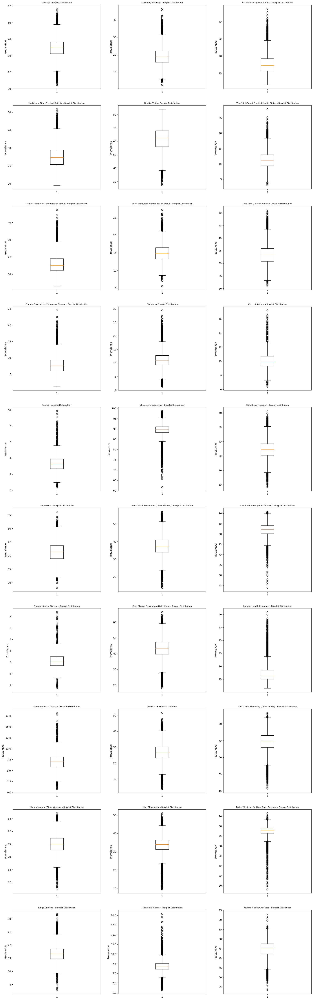

In [12]:
# Boxplots here

rows = 10
cols = 3
fig, axs = plt.subplots(rows, cols)
fig.set_figheight(7*rows)
fig.set_figwidth(7*cols)
for i in range(rows):
    for j in range(cols):
        X = strength.index[i*cols+j+1]
        axs[i, j].boxplot(medical_df[X])
        axs[i, j].set_title(f"{X} - Boxplot Distribution", fontdict={"fontsize":8})
        axs[i, j].set_ylabel("Prevalence")
plt.show()

In [13]:
# Define a function to create Linear Regression plots because this is a mouthful
# Takes in independent and dependent variables as series and spits back out a linear regression equation
# As we'll be needing Pearson-R stuff, it's in our best interest to use the more unruly SciPy method
def reg_this(x, y):
    result = linregress(x, y)
    
    # Access values with reg_this(x,y).slope, .intercept, .rvalue (Pearson-R), .pvalue (Hypothesis test for statistical significance of discovered regression), .stderr (Standard Error)
    return result

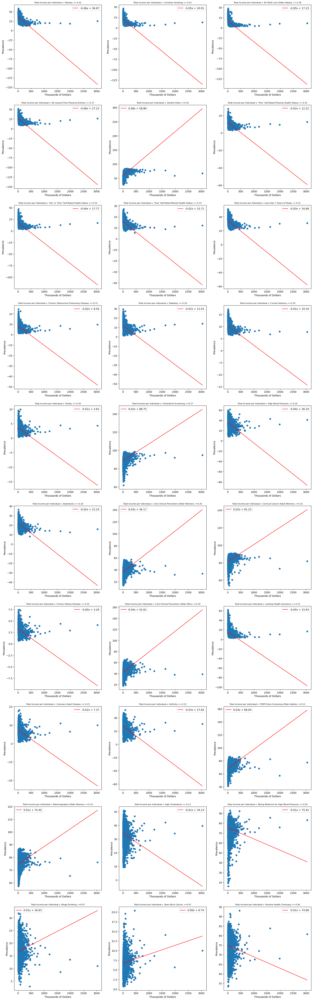

In [118]:
# Results indicate that we have to remove outliers for the charts to make sense, probably
# Results not necessarily best represented by linear models of regression

rows = 10
cols = 3
fig, axs = plt.subplots(rows, cols)
fig.set_figheight(7*rows)
fig.set_figwidth(7*cols)
for i in range(rows):
    for j in range(cols):
        X = strength.index[0]
        Y = strength.index[i*cols+j+1]
        result = reg_this(medical_df[X], medical_df[Y])
        axs[i, j].scatter(medical_df[X], medical_df[Y])
        axs[i, j].plot(medical_df[X], (result.slope*medical_df[X]+result.intercept), label = f"{result.slope:.2f}x + {result.intercept:.2f}", color = "red")
        axs[i, j].set_title(f"{X} v. {Y}, r={result.rvalue:.2f}", fontdict={"fontsize":8})
        axs[i, j].set_xlabel("Thousands of Dollars")
        axs[i, j].set_ylabel("Prevalence")
        axs[i, j].legend(loc="best")
plt.savefig("Results/unculled_regressions_AGIvHealth.png")
plt.show()

## Redo, but with top 100filtered out

In [20]:
culled_df = medical_df.loc[medical_df["Total Income per Individual"] <= ub]
culled_df.to_csv("Resources/AGI+medical_data.csv")

NameError: name 'strength' is not defined

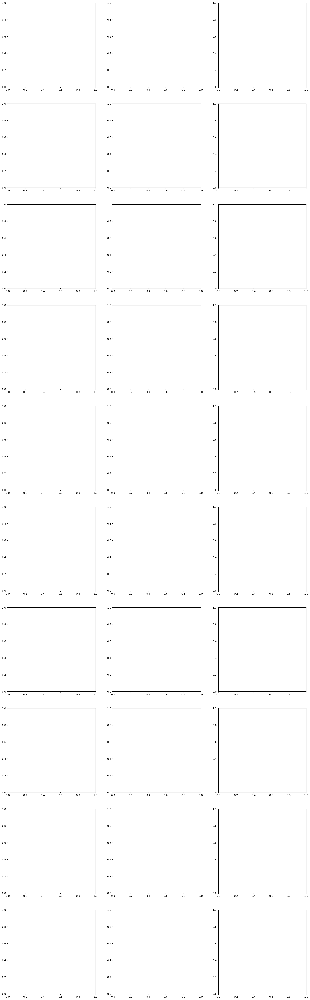

In [21]:
# Results indicate that we have to remove outliers for the charts to make sense, probably
# Results not necessarily best represented by linear models of regression

rows = 10
cols = 3
fig, axs = plt.subplots(rows, cols)
fig.set_figheight(7*rows)
fig.set_figwidth(7*cols)
for i in range(rows):
    for j in range(cols):
        X = strength.index[0]
        Y = strength.index[i*cols+j+1]
        result = reg_this(culled_df[X], culled_df[Y])
        axs[i, j].scatter(culled_df[X], culled_df[Y])
        axs[i, j].plot(culled_df[X], (result.slope*culled_df[X]+result.intercept), label = f"{result.slope:.2f}x + {result.intercept:.2f}", color = "red")
        axs[i, j].set_title(f"(CULLED) {X} v. {Y}, r={result.rvalue:.2f}", fontdict={"fontsize":8})
        axs[i, j].set_xlabel("Thousands of Dollars")
        axs[i, j].set_ylabel("Prevalence")
        axs[i, j].legend(loc="best")
plt.savefig("Results/culled_regressions_AGIvHealth.png")
plt.show()

In [140]:
strength.index

Index(['Total Income per Individual', 'Obesity', 'Currently Smoking',
       'All Teeth Lost (Older Adults)', 'No Leisure-Time Physical Activity',
       'Dentist Visits', ''Poor' Self-Rated Physical Health Status',
       ''Fair' or 'Poor' Self-Rated Health Status',
       ''Poor' Self-Rated Mental Health Status', 'Less than 7 Hours of Sleep',
       'Chronic Obstructive Pulmonary Disease', 'Diabetes', 'Current Asthma',
       'Stroke', 'Cholesterol Screening', 'High Blood Pressure', 'Depression',
       'Core Clinical Prevention (Older Women)',
       'Cervical Cancer (Adult Women)', 'Chronic Kidney Disease',
       'Core Clinical Prevention (Older Men)', 'Lacking Health Insurance',
       'Coronary Heart Disease', 'Arthritis',
       'FOBT/Colon Screening (Older Adults)', 'Mammography (Older Women)',
       'High Cholesterol', 'Taking Medicine for High Blood Pressure',
       'Binge Drinking', '(Non-Skin) Cancer', 'Routine Health Checkups'],
      dtype='object')

In [155]:
# Plug in desired column in X, your max point size in Y, and the scope of your map in Range
X = "Obesity"
Y = 500

test_df = culled_df.sort_values(X, ascending=False)[["Total Income per Individual", "STATE", X, "lng","lat"]]

# This is just here so people can see the correlation coefficient conveniently
result = reg_this(test_df["Total Income per Individual"], test_df[X])

# State-level views are used because a full nationwide view typically lags too much
# You can use "test_df.loc[~test_df["STATE"].isin(["AK","HI"])]" to see the mainland
# You can use something like "test_df = test_df.loc[test_df["STATE"]=="NY"]" to see a single state
test_df = test_df.loc[test_df["STATE"]=="NY"]

# A new column is created such that the bigger prevalences are scaled closer to Max Point Size Y while the smaller points are scaled closer to 0
# This accentuates the differences in point size for the purposes of these visualizations
test_df["Scaled"] = (test_df[X]-test_df[X].min()+0.01)**math.log(Y, test_df[X].max()-test_df[X].min())

money_plot = test_df.hvplot.points(
    "lng",
    "lat",
    geo = True,
    tiles = "CartoLight",
    frame_width = 800,
    frame_height = 400,
    color = "Total Income per Individual",
    alpha = .7,
    colorbar = True,
    size = "Scaled",
    xlabel="Longitude",
    ylabel="Latitude",
    title= f"(CULLED) ZIPCODES by MONEY (Color) and {X} (Size), r={result.rvalue:.2f}"
)

print(f"{X} Prevalence from {test_df[X].max()} to {test_df[X].min()}")
money_plot

Obesity Prevalence from 46.9 to 12.3


:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lng,lat]   (Total Income per Individual,Scaled)